In [4]:
import pandas as pd

In [5]:
import numpy as np

In [6]:
## thish is a colab notebook

In [7]:
import tensorflow as tf
print("tf version:",tf.__version__)


tf version: 2.15.0


In [8]:
##import some tooles
import tensorflow as tf
import tensorflow_hub as hub
print("hub version:",hub.__version__)


hub version: 0.15.0


In [9]:
# ##  chek gpu availability
print("Gpu avaiable" if tf.config.list_physical_devices("GPU")  else "not available")

Gpu avaiable


Work section in **GPU**

In [10]:
#GETTING OUR DATA READY IN to TENSORS
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())



                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:

## how many images of each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

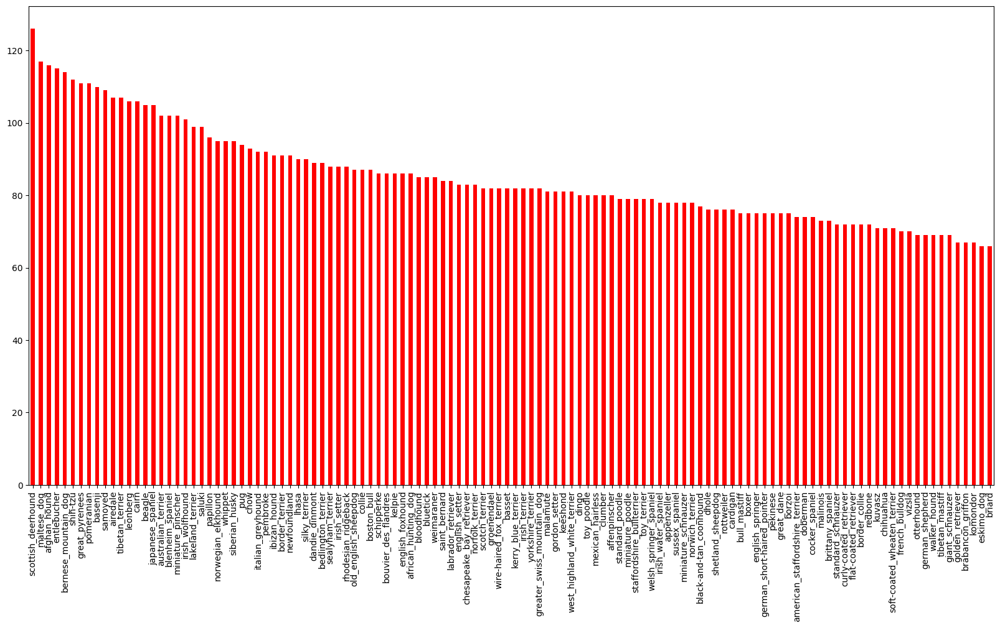

In [13]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10),color='red')

In [14]:
labels_csv["breed"].value_counts().median()

82.0

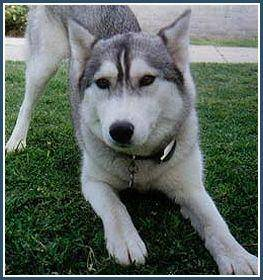

In [15]:
## view an images
from IPython.display import Image
# Image("/content/drive/MyDrive/dog vision/train/011e06760794850c40f23d6426c40774.jpg")
Image("/content/drive/MyDrive/dog vision/train/1699a179453b177a5e895c5b5ecb3624.jpg")


In [16]:
filename=["drive/MyDrive/dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]


In [17]:
filename[9000]
import os
os.listdir("drive/MyDrive/dog vision/train/")[:10]


['f2b5ba1f32494b942731fb5248e114a8.jpg',
 'f0e2319cf6cf322ea6f5849eb4102fac.jpg',
 'ea43ab0fec05595317c008853e9798ef.jpg',
 'f1512dff4effc6df01f50baa1135c139.jpg',
 'ea57f2db5aca0955ff2eb8ba7ea8acc2.jpg',
 'f0216b542b2feaf7fea3412ce949536e.jpg',
 'ee6b47bfe941098216982c8e42f2912b.jpg',
 'eccc1f78f99e1f5fc1fa618be4ae7f67.jpg',
 'f2fb3f693de68e2564fbff2890f7ad40.jpg',
 'ed38d69eab73e9a66526ee16231f687a.jpg']

In [18]:
import os

if len(os.listdir("drive/MyDrive/dog vision/train/")) == len(filename):
  print("File name match  actual amount of file:")
else:
  print("filename do not match check the target ditectory")

File name match  actual amount of file:


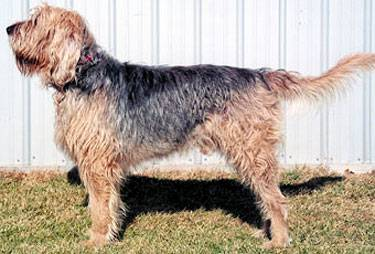

In [19]:
Image(filename[500])

In [20]:
labels_csv["breed"][9]

'scottish_deerhound'

In [21]:

labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [22]:




labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [23]:







# checking missing data
if len(labels)== len(filename):
  print("number of labels are match")
else:
  print("number of the labe are not match")


number of labels are match


In [24]:
from tensorflow.python.ops.gen_array_ops import unique
# find unique labels
unique=np.unique(labels)
len(unique)
unique

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [25]:
print(labels[0])
labels[0]==unique



boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [26]:
boolean_label=[label== unique for label in labels]
boolean_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [27]:

len(boolean_label)

10222

In [28]:
print(labels[0])
print(np.where(unique == labels[0]))
print(boolean_label[0].argmax())
print(boolean_label[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [29]:

## Creating our own validation data set
x=filename
y=boolean_label


In [30]:
# creating a slider for taking image data
NUM_IMG=1000  #@param{type:"slider",min:1000,max:10000,step:100}

In [31]:
from  sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMG],
                                             y[:NUM_IMG],
                                            test_size=0.2,
                                             random_state=42)
len(x_train),len(y_train),len(x_val),len(y_val)


(800, 800, 200, 200)

In [32]:

## processing images
# convert image in to numpy array
from matplotlib.pyplot import imread



In [33]:
filename[500]

'drive/MyDrive/dog vision/train/0c0fb87fb13f0f6c8d21ff6c15e3361e.jpg'

In [34]:

# index_img=Image("drive/MyDrive/dog vision/train/0c0fb87fb13f0f6c8d21ff6c15e3361e.jpg")
# index_img

In [35]:
image=imread(filename[42])
image.shape

(257, 350, 3)

In [36]:
image  # image in form of numpy array

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [37]:
image.max(),image.min()

(255, 0)

In [38]:
tf.constant(image)[:2]   # turn image in to the tensor

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [39]:
# Difine image size
IMG_SIZE=224
# function of preprocessing image
def process_image(image_path,img_size=IMG_SIZE):
  image=tf.io.read_file(image_path)
# turn the jpg image into 3 color  channal
  image=tf.image.decode_jpeg(image,channels=3)
# convert the  color channel values
  image=tf.image.convert_image_dtype(image,tf.float32)
# resize the image
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image



In [40]:
## Turning our data into batches
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label


In [41]:
(process_image(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [42]:
## turn our data into tupels of tensor an batches
# batch size=32 is good
BATCH_SIZE=32
# create function
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
# if the data is test dataset,we probably don't have  labels
   if test_data:
      print("create the test data batches")
      data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
      data_batch=data.map(process_image).batch(BATCH_SIZE)
      return data_batch

# if the data is a valid set , we don't suffle our data
   elif valid_data:
      print("create validating data batches")
      data=  data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                      tf.constant(y)))
      data_batch= data.map(get_image_label).batch(BATCH_SIZE)
      return data_batch
   else:
      print("create training data batches")
      data=  data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                      tf.constant(y)))
      # shuffle the data
      data=data.shuffle(buffer_size=len(x))
      data=data.map(get_image_label)
      # TURN  THE TRAINING DATA INTO BATCHES
      data_batch=data.batch(BATCH_SIZE)
      return data_batch

In [43]:
# create  training and validation data batches
train_data= create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

create training data batches
create validating data batches


In [44]:
train_data.element_spec,val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [45]:
#visualizing data batches
import matplotlib.pyplot as plt
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):

    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique[y[i].argmax()])
    plt.axis("off")

In [46]:

train_image,train_labels=next(train_data.as_numpy_iterator()) # unbatch our data




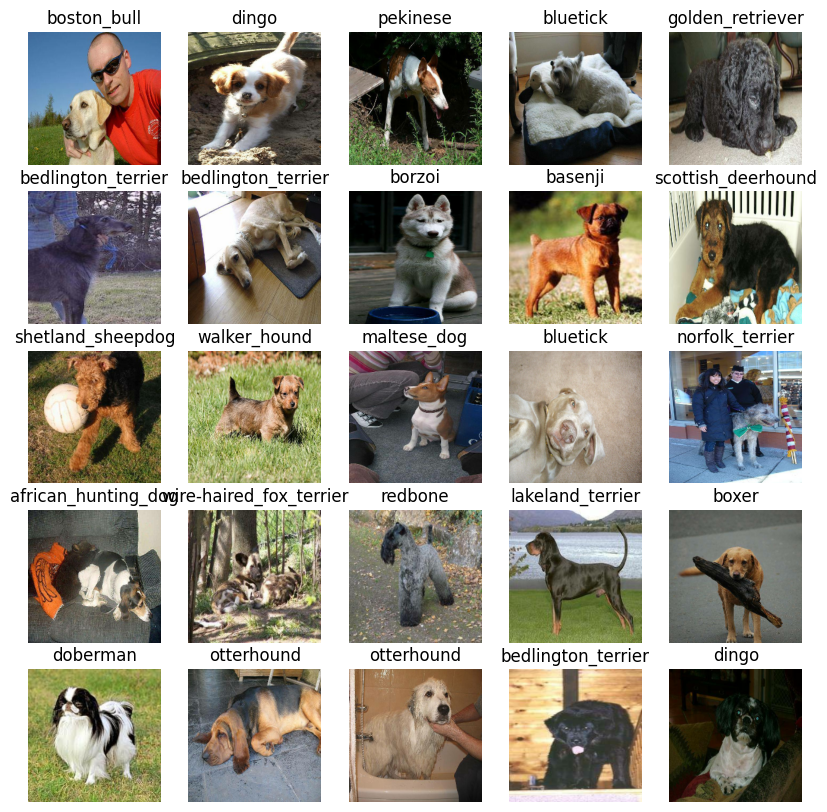

In [47]:
train_image,train_labels=next(train_data.as_numpy_iterator()) # unbatch our data
show_25_images(train_image,train_labels)

In [48]:
unique[y[5]]

array(['bedlington_terrier'], dtype=object)

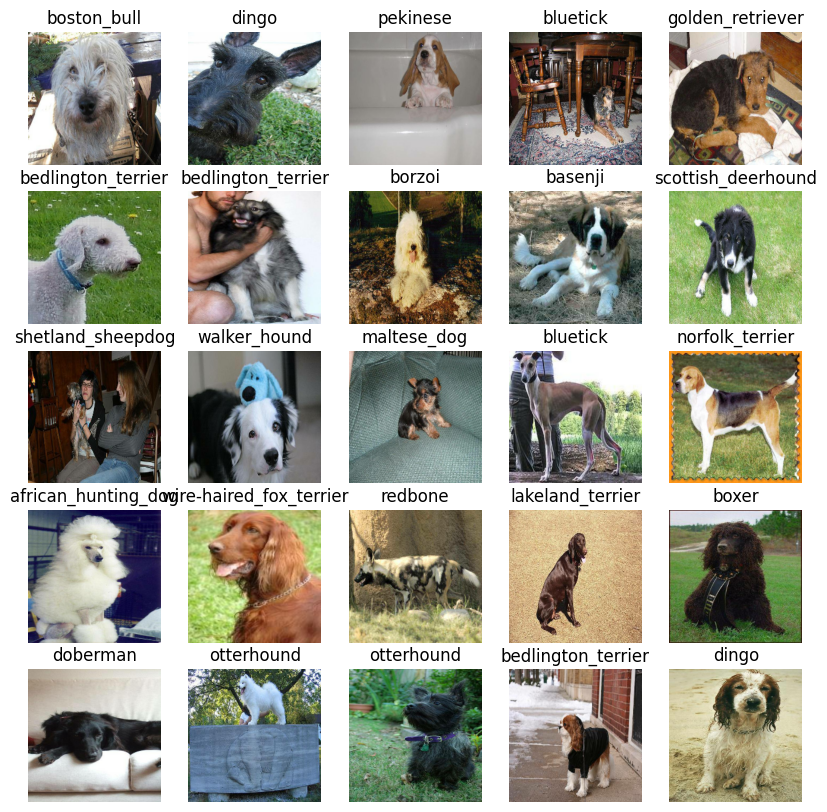

In [49]:
# validation data  set visualization
val_imeges,val_labels=next(val_data.as_numpy_iterator())

show_25_images(val_imeges,val_labels)

In [50]:
# Build  our model
 # set up nput shape
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]# BATCH,HEIGHT,WIDTH,COLORCHANNEL
OUTPUT_SHAPE=len(unique)
 # setup model url tensorflow hub
MODEL_URL= "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


In [51]:
def create_model(inpute_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("building mode with:" ,MODEL_URL)
  # set up the model layer
  model=tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL),# input layer
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                         activation="softmax") # layer 2 output layer

  ])
  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]

  )
  # build the model
  #model name is "mobilenet_v2_1.3_224/mobilenet_v2_1.3_224.ckpt "
  model.build(INPUT_SHAPE)
  return model


In [52]:
model=create_model()           # The “Param #” column shows you the number of parameters that are trained for each layer. The total number of parameters is shown at the end, which is equal to the number of trainable and non-trainable parameters. In this model, all the layers are trainable.
model.summary()


building mode with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [53]:
# outputs=np.ones(shape=(1,1,1280))
# outputs

In [54]:
# callbacks
#Load tensorbord notebook
%load_ext tensorboard


In [55]:
import datetime
def create_tensorboard_calback():
  logdir=os.path.join("drive/MyDrive/dogvision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)


In [56]:
# creatye stopping  early callbacks
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

In [57]:
#Traning the model
NUM_EPOCHS = 10 # @param {type:"slider", min:10, max:100, step:10}

In [58]:
def train_model():
  model=create_model()
  # create tensotboard session
  tensorboard=  create_tensorboard_calback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
          validation_data=val_data,
          validation_freq=1,
          callbacks=[tensorboard, early_stopping])
  return model


In [59]:
# fit the model to the data
model=train_model()
#  OUR MODEL ARE OVERFITTING

building mode with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/10
25/25 [==============================] - 227s 9s/step - loss: 4.6350 - accuracy: 0.0887 - val_loss: 3.6093 - val_accuracy: 0.2250
Epoch 2/10
25/25 [==============================] - 2s 99ms/step - loss: 1.6695 - accuracy: 0.6712 - val_loss: 2.2709 - val_accuracy: 0.4700
Epoch 3/10
25/25 [==============================] - 4s 156ms/step - loss: 0.5866 - accuracy: 0.9312 - val_loss: 1.7240 - val_accuracy: 0.5700
Epoch 4/10
25/25 [==============================] - 3s 116ms/step - loss: 0.2638 - accuracy: 0.9825 - val_loss: 1.5203 - val_accuracy: 0.6000
Epoch 5/10
25/25 [==============================] - 2s 96ms/step - loss: 0.1512 - accuracy: 0.9975 - val_loss: 1.4549 - val_accuracy: 0.6050
Epoch 6/10
25/25 [==============================] - 2s 93ms/step - loss: 0.1032 - accuracy: 0.9987 - val_loss: 1.4093 - val_accuracy: 0.6350
Epoch 7/10
25/25 [==============================] - 2s 96ms/

In [60]:
%tensorboard --logdir /content/drive/MyDrive/dogvision/logs

Output hidden; open in https://colab.research.google.com to view.

In [61]:
# making and evaluating predition our trained model
val_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [62]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 75ms/step


array([[1.1701812e-04, 2.4443565e-05, 5.4476928e-04, ..., 1.1422546e-04,
        2.9631035e-05, 1.6804513e-03],
       [5.6317309e-04, 2.3765743e-03, 3.4104925e-02, ..., 1.7727722e-03,
        2.5947553e-03, 1.7000736e-04],
       [7.7073564e-06, 3.8150887e-05, 4.2659690e-06, ..., 1.8315065e-04,
        3.1274034e-05, 1.1252121e-04],
       ...,
       [2.2403130e-05, 7.6960883e-04, 1.7588367e-04, ..., 9.7932199e-05,
        9.6510768e-05, 2.5362152e-04],
       [1.5102590e-02, 1.1654806e-04, 2.4296933e-04, ..., 3.7250732e-04,
        6.1177365e-05, 1.1155659e-02],
       [2.6288896e-04, 4.1287483e-05, 7.3973462e-04, ..., 5.9126080e-03,
        1.3027987e-03, 1.7872195e-04]], dtype=float32)

In [63]:
predictions.shape

(200, 120)

In [64]:
len(y_val)


200

In [65]:
predictions[0]

array([1.17018120e-04, 2.44435651e-05, 5.44769282e-04, 2.86238996e-04,
       5.67577008e-05, 4.89088852e-05, 8.15316569e-03, 7.86649616e-05,
       2.81824396e-05, 3.79822945e-04, 4.53121436e-04, 1.68054739e-05,
       1.19390985e-04, 2.00813956e-05, 2.22218470e-04, 4.74973145e-04,
       7.13935951e-05, 2.30695471e-01, 8.49348271e-06, 2.03796644e-05,
       9.97464289e-04, 2.01950810e-04, 2.97250590e-05, 2.01887553e-04,
       2.54030856e-05, 1.84073157e-04, 4.21574354e-01, 8.24939707e-05,
       7.02181424e-05, 5.23939438e-04, 1.08204156e-04, 4.69830324e-04,
       9.71489644e-04, 2.35793104e-05, 2.51210713e-05, 1.16844699e-02,
       1.48710151e-05, 9.89263761e-04, 1.69593186e-04, 4.14831848e-05,
       2.03810958e-03, 7.88125635e-06, 7.64752549e-05, 4.70417654e-05,
       5.37634151e-05, 3.26839727e-05, 3.27405614e-05, 2.59030930e-04,
       9.78043885e-04, 5.03705960e-05, 4.06079562e-05, 2.27903201e-05,
       1.97384419e-04, 2.65002636e-05, 1.12535017e-04, 1.70018277e-04,
      

In [66]:
len(predictions[0])

120

In [67]:
np.sum(predictions[0])
unique

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [68]:
# first predictions
index=42
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"sum: {np.sum(predictions[index])}")
print(f"Max index:{np.argmax(predictions[index])}")
print(f"predicted label:{unique[np.argmax(predictions[index])]}")

[3.0036891e-04 2.4302842e-04 8.1736260e-05 1.5729059e-04 2.2119710e-03
 1.7401492e-04 3.3955672e-04 2.1073869e-03 5.2605043e-03 4.7457963e-02
 2.6882008e-05 2.0644236e-05 9.7134814e-04 7.2084032e-03 2.6461028e-03
 4.1465079e-03 1.8393175e-05 1.5704133e-04 4.6724686e-04 9.4386417e-04
 1.5286831e-05 6.0758035e-04 7.2954710e-05 7.0873852e-05 8.4706629e-03
 7.2417148e-05 1.0679833e-04 1.4997312e-04 1.3460053e-04 1.6079091e-04
 4.7238911e-05 7.9597805e-05 9.0384099e-05 4.0975585e-05 2.4081735e-05
 2.6492033e-05 4.0066853e-04 5.1316735e-04 3.2509273e-05 3.5715118e-01
 2.6228165e-04 6.0421447e-05 7.7025481e-03 2.1979346e-05 1.6581477e-04
 4.5241621e-05 3.1291979e-04 1.7741348e-03 2.9235936e-05 3.3554251e-04
 1.3681226e-04 1.3541876e-04 5.8894540e-04 5.9237792e-03 2.3137238e-05
 6.8620441e-04 1.2097036e-04 1.0631310e-04 7.3118463e-05 1.6626685e-04
 1.3868262e-04 1.0103738e-03 1.0149058e-05 1.9794272e-04 6.9027388e-04
 1.9120595e-04 6.5143584e-05 1.7907986e-04 9.0908492e-05 8.1690596e-05
 3.611

In [69]:
# turn prediction probabilities into their respactive label

def get_pred_label(prediction_probabilities):
  """
  Turn an array of prediction probabilities into a label
  """
  return unique[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

In [70]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [71]:
#  create function unbatch a batch dataset
def unbatchify(data):
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique[np.argmax(label)])
  return images,labels
# Unbatchify the validation data
val_image,val_labels =  unbatchify(val_data)
val_image[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [72]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

   # get a pred label
  pred_label=get_pred_label(pred_prob)
   # plot iamges
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # change the color if the prediction is correct or wrong
  if pred_label == true_label:
    color='green'
  else:
      color='red'


  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

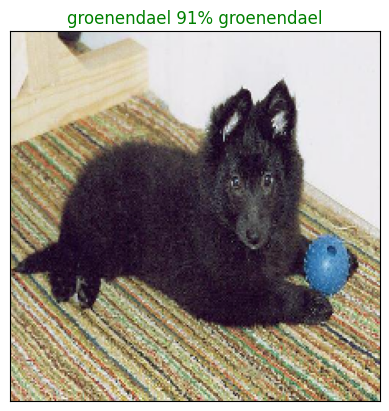

In [73]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_image,
          n=77)

In [74]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  plots thetop 10 higest prediction confidence along with the truth label for sample n
  """
  pred_prob,truth_label=prediction_probabilities[n],labels[n]
  pred_label =get_pred_label(pred_prob)
  # find the top 10 prediction confidence index
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
   # find the top 10 prediction confidence values

  top_10_pred_values=pred_prob[top_10_pred_indexes]
 # find the top 10 prediction labels
  top_10_pred_labels=unique[top_10_pred_indexes]
  # setup the plot
  top_plot=plt.bar(np.arange(len(  top_10_pred_labels)),
                    top_10_pred_values,
                  color="grey")
  plt.xticks(np.arange(len(  top_10_pred_labels)),
             labels=  top_10_pred_labels,
             rotation="vertical")
  #  change the color of the true labels
  if np.isin(truth_label,  top_10_pred_labels):
    top_plot[np.argmax(  top_10_pred_labels==truth_label)].set_color("green")
  else:
      pass


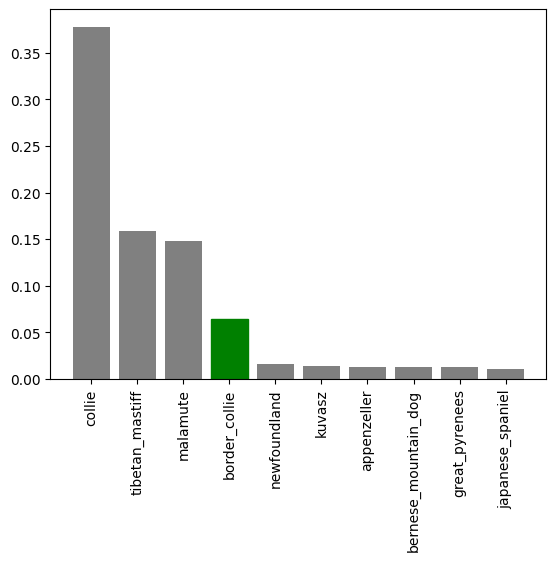

In [75]:
plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=9)

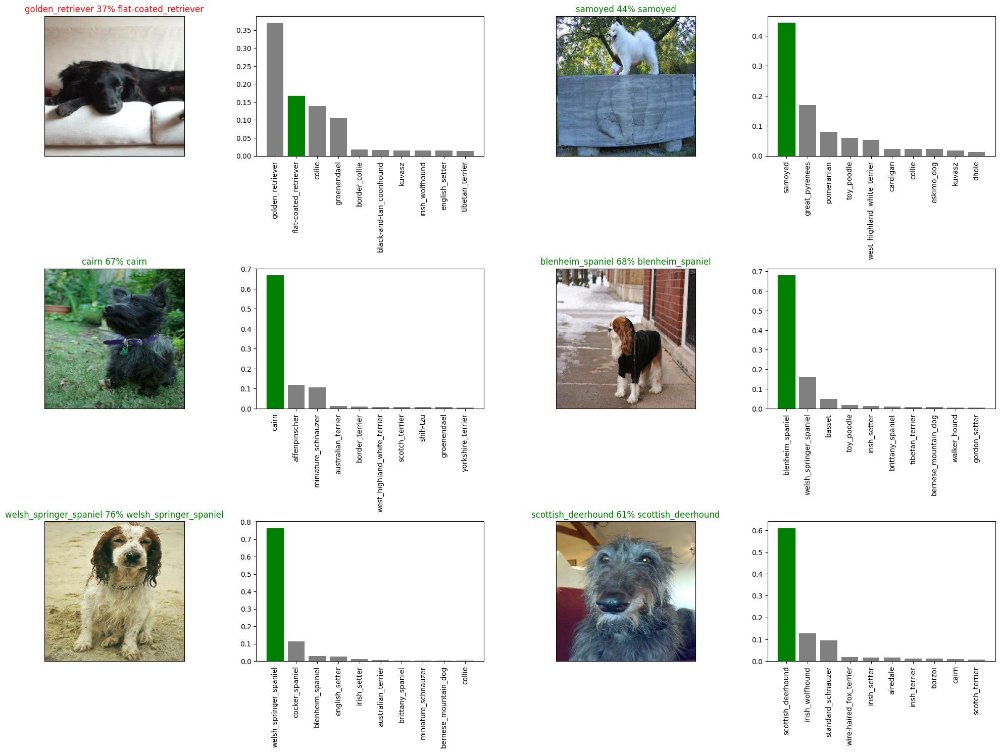

In [76]:
i_multiplier=20
num_row=3
num_cols=2
num_images=num_row*num_cols
plt.figure(figsize=(10*num_cols,5*num_row))
for i in range(num_images):
  plt.subplot(num_row,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_image,
            n=i+i_multiplier)
  plt.subplot(num_row,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
            labels=val_labels,
            n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


In [123]:
# saving and reloading our model
def save_model(model,suffix=None):
  """ saves the given model in the models directoty and  appends a suffix(string)
  """
  # create a model dirrectoy pathname with current time
  modeldir=os.path.join ("/content/drive/MyDrive/dogvision/logs/models",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir + "-" + suffix + ".h5" # save formate of  model
  print(f"Saving model to: {model_path}...")

  model.save(model_path)
  return model_path

In [78]:
# create a function to load a model
def load_model(model_path):
  """ load  model from a spcefied path
  """
  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [79]:
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/dogvision/logs/models/20240110-12421704890567-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/dogvision/logs/models/20240110-12421704890567-1000-images-mobilenetv2-Adam.h5'

In [80]:
loded_1000_images_model=load_model('/content/drive/MyDrive/dogvision/logs/models/20231224-13541703426041-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/dogvision/logs/models/20231224-13541703426041-1000-images-mobilenetv2-Adam.h5


In [81]:
# Evaluate the pre-saved model
model.evaluate(val_data)


7/7 [==============================] - 1s 64ms/step - loss: 1.3122 - accuracy: 0.6550


[1.3121758699417114, 0.6549999713897705]

In [82]:
# Evaluate the loded model
loded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 73ms/step - loss: 1.3029 - accuracy: 0.6750


[1.302869439125061, 0.675000011920929]

In [83]:
# Training the full data model
len(x),len(y)

(10222, 10222)

In [84]:
# create a data batch with the full data set
full_data= create_data_batches(x,y)

create training data batches


In [85]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [86]:
full_model=create_model()

building mode with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [87]:
# create full model callback
full_model_tensorbord = create_tensorboard_calback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)


In [88]:
# fit the ful,model on the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorbord,full_model_early_stopping])

Epoch 1/10
320/320 [==============================] - 32s 88ms/step - loss: 1.3477 - accuracy: 0.6660
Epoch 2/10
320/320 [==============================] - 28s 86ms/step - loss: 0.4001 - accuracy: 0.8831
Epoch 3/10
320/320 [==============================] - 25s 78ms/step - loss: 0.2355 - accuracy: 0.9360
Epoch 4/10
320/320 [==============================] - 27s 85ms/step - loss: 0.1547 - accuracy: 0.9631
Epoch 5/10
320/320 [==============================] - 28s 88ms/step - loss: 0.1093 - accuracy: 0.9778
Epoch 6/10
320/320 [==============================] - 26s 83ms/step - loss: 0.0781 - accuracy: 0.9855
Epoch 7/10
320/320 [==============================] - 44s 137ms/step - loss: 0.0592 - accuracy: 0.9916
Epoch 8/10
320/320 [==============================] - 25s 78ms/step - loss: 0.0459 - accuracy: 0.9941
Epoch 9/10
320/320 [==============================] - 27s 86ms/step - loss: 0.0381 - accuracy: 0.9959
Epoch 10/10
320/320 [==============================] - 26s 82ms/step - loss: 0.02

In [120]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/dogvision/logs/models/20240110-13141704892441-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/dogvision/logs/models/20240110-13141704892441-full-image-set-mobilenetv2-Adam.h5'

In [163]:
# load the full model
loded_full_model = load_model("/content/drive/MyDrive/dogvision/logs/models/20240110-13141704892441-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/dogvision/logs/models/20240110-13141704892441-full-image-set-mobilenetv2-Adam.h5


In [131]:
# making predictions in test data set

test_path="/content/drive/MyDrive/dog vision/test/"
test_filename = [test_path +fname for fname in os.listdir(test_path)]
test_filename[:10]

['/content/drive/MyDrive/dog vision/test/3bb33b3c3e9edd464b3fed1407ecfd19.jpg',
 '/content/drive/MyDrive/dog vision/test/3bb5b0beec0daeeb1d45f8009c27741c.jpg',
 '/content/drive/MyDrive/dog vision/test/3bb8c11ab8b925a043e3a98a328098d0.jpg',
 '/content/drive/MyDrive/dog vision/test/3bbdb72ff6a0ad3b87077ff38b3ec468.jpg',
 '/content/drive/MyDrive/dog vision/test/3bc76187c1526db705e4ca5e7c1b8aa2.jpg',
 '/content/drive/MyDrive/dog vision/test/3bdb4339b944b9e7daeaa79b5a310707.jpg',
 '/content/drive/MyDrive/dog vision/test/3bdfc1212d313cfcc9aa332d4e178669.jpg',
 '/content/drive/MyDrive/dog vision/test/3be44add5ba0c62fdcd58fb4ec1f8f63.jpg',
 '/content/drive/MyDrive/dog vision/test/3be602e5b58c0274b72ad5322d3c8601.jpg',
 '/content/drive/MyDrive/dog vision/test/3be73df791861f57f93dd0c263264e76.jpg']

In [92]:
len(test_filename)


10357

In [93]:
# create test data batches
test_data=create_data_batches(test_filename, test_data=True)

create the test data batches


In [94]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [95]:
# make prediction on the test data
# make prediction on the test data
test_predictions = loded_full_model.predict(test_data,
                                           verbose=1)

324/324 [==============================] - 164s 488ms/step


In [132]:
np.savetxt("drive/MyDrive/dog vision/preds_array.csv",test_predictions,delimiter=",")

In [97]:
test_predictions = np.loadtxt("drive/MyDrive/dog vision/preds_array.csv",delimiter=",")


In [133]:
test_predictions[:10]

array([[3.38928530e-08, 4.84000895e-10, 2.85902326e-11, ...,
        2.80070633e-10, 1.56431437e-10, 2.20527527e-10],
       [1.94565661e-08, 6.49402199e-11, 5.85030557e-09, ...,
        1.32925670e-08, 7.55792053e-06, 5.63455501e-07],
       [2.31115692e-07, 1.63546920e-09, 2.65365663e-09, ...,
        9.18161280e-09, 7.13358761e-10, 1.59124824e-10],
       ...,
       [3.59979491e-10, 1.61321324e-07, 1.32497657e-08, ...,
        1.98910811e-07, 3.07778066e-07, 1.96448738e-07],
       [1.48661400e-07, 5.16686782e-09, 9.54903978e-09, ...,
        4.90241936e-09, 6.93297130e-04, 4.84586337e-07],
       [8.27452750e-05, 5.70472366e-07, 1.08170903e-11, ...,
        5.23799208e-08, 1.54553141e-04, 7.34321901e-08]])

In [200]:
custom_path="/content/drive/MyDrive/dog vision/Untitled Folder/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]





In [201]:
custom_image_path


['/content/drive/MyDrive/dog vision/Untitled Folder/david-lezcano-m-Doa-GTrUw-unsplash.jpg',
 '/content/drive/MyDrive/dog vision/Untitled Folder/jamie-street-MoDcnVRN5JU-unsplash.jpg',
 '/content/drive/MyDrive/dog vision/Untitled Folder/alvan-nee-8g0D8ZfFXyA-unsplash.jpg']

In [178]:

custom_data = create_data_batches(custom_image_path,test_data=True)
custom_data

create the test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [179]:
# make  predictions on the ustom data
custom_preds = loded_full_model.predict(custom_data)



1/1 [==============================] - 2s 2s/step


In [180]:
custom_pred_label = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]


create the test data batches
1/1 [==============================] - 2s 2s/step


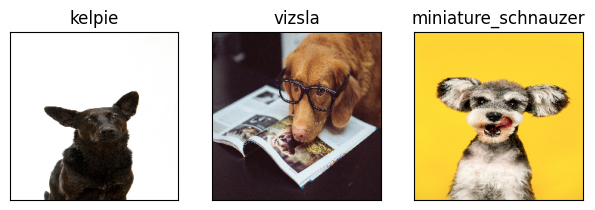

In [202]:
# get image file path
custom_path = "/content/drive/MyDrive/dog vision/Untitled Folder/"
custom_image_path =[custom_path + fname for fname in os.listdir(custom_path)]
# turn custom image in to data batches
custom_data= create_data_batches(custom_image_path,test_data=True)
# make prediction in custom data
custom_preds=loded_full_model.predict(custom_data)
# get custom image prediction label
custom_pred_label=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_label
# get custom images(our unbatchify function)
custom_images=[]
# loop through unbatch data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)
# check custom image predictions
plt.figure(figsize=(10,10))
for i , image in enumerate (custom_images):
  plt.subplot(1,4,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_label[i])
  plt.imshow(image)

